In [2]:
!pip install yolov7detect
!pip install Pillow
!pip install transformers
!pip install torchvision

^C


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-intel 2.16.1 requires numpy<2.0.0,>=1.23.5; python_version <= "3.11", but you have numpy 1.21.6 which is incompatible.
tensorflow-intel 2.16.1 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.20.3, but you have protobuf 4.21.2 which is incompatible.


  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for yolov7detect: filename=yolov7detect-1.0.1-py3-none-any.whl size=131626 sha256=13ab0d8b2b8e8cf049f90d192eac5f0a61e76ee5507408c48e11bc8854a12d89
  Stored in directory: c:\users\jakub\appdata\local\pip\cache\wheels\fe\9a\dc\2ed1d08657346810483c675d764f1615424e158f8f2fead4b1
Successfully built yolov7detect
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.3
    Uninstalling protobuf-4.25.3:
      Successfully uninstalled protobuf-4.25.3

In [1]:
from PIL import Image
from transformers import YolosFeatureExtractor, YolosForObjectDetection
import torch
import matplotlib.pyplot as plt
from torchvision.transforms import ToTensor, ToPILImage
import yolov7
import os
PERSON_ID = 0

d:\anaconda\lib\site-packages\requests\__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.2.0)/charset_normalizer (2.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


In [2]:
%matplotlib inline

## Human Detector

In [15]:
# load pretrained or custom model
human_detector = yolov7.load('kadirnar/yolov7-v0.1', hf_model=True)

# set model parameters
human_detector.conf = 0.8  # NMS confidence threshold
human_detector.iou = 0.45  # NMS IoU threshold
human_detector.classes = PERSON_ID  # filter by class

Fusing layers... 


d:\anaconda\lib\site-packages\torch\functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3550.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [ ]:
#human_detector.to('cuda')

In [16]:
def human_detection(human_detector, img_path, img_pad=None):
    # perform inference
    results = human_detector(img_path)

    predictions = results.pred[0]
    boxes = predictions[:, :4] # x1, y1, x2, y2
    scores = predictions[:, 4]
    categories = predictions[:, 5]

    detections = []
    if img_pad is None:
        img_pad = 0
    for bbox in boxes:
        x_tl, y_tl, x_br, y_br = bbox
        x_tl = int(x_tl.item() - img_pad)
        y_tl = int(y_tl.item() - img_pad)
        x_br = int(x_br.item() + img_pad)
        y_br = int(y_br.item() + img_pad)
        #detections.append([x_tl, y_tl, x_br - x_tl, y_br - y_tl]) # xywh
        detections.append([x_tl, y_tl, x_br, y_br]) # xyxy
    return detections

## Object Detection Utils

In [17]:
# This is the order of the categories list. NO NOT CHANGE. Just for visualization purposes
cats = ['shirt, blouse', 'top, t-shirt, sweatshirt', 'sweater', 'cardigan', 'jacket', 'vest', 'pants', 'shorts', 'skirt', 'coat', 'dress', 'jumpsuit', 'cape', 'glasses', 'hat', 'headband, head covering, hair accessory', 'tie', 'glove', 'watch', 'belt', 'leg warmer', 'tights, stockings', 'sock', 'shoe', 'bag, wallet', 'scarf', 'umbrella', 'hood', 'collar', 'lapel', 'epaulette', 'sleeve', 'pocket', 'neckline', 'buckle', 'zipper', 'applique', 'bead', 'bow', 'flower', 'fringe', 'ribbon', 'rivet', 'ruffle', 'sequin', 'tassel']

In [18]:
def fix_channels(t):
    """
    Some images may have 4 channels (transparent images) or just 1 channel (black and white images), in order to let the images have only 3 channels. I am going to remove the fourth channel in transparent images and stack the single channel in back and white images.
    :param t: Tensor-like image
    :return: Tensor-like image with three channels
    """
    if len(t.shape) == 2:
        return ToPILImage()(torch.stack([t for i in (0, 0, 0)]))
    if t.shape[0] == 4:
        return ToPILImage()(t[:3])
    if t.shape[0] == 1:
        return ToPILImage()(torch.stack([t[0] for i in (0, 0, 0)]))
    return ToPILImage()(t)

In [19]:
def idx_to_text(i):
    return cats[i]

In [20]:
# Random colors used for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes, image_path):
    fig = plt.figure(
        figsize=(16,10)
    )
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        ax.text(xmin, ymin, idx_to_text(cl), fontsize=10,
                bbox=dict(facecolor=c, alpha=0.8))
    plt.axis('off')
    #plt.show()
    plt.savefig(image_path)
    fig.canvas.draw()
    return Image.frombytes('RGB', fig.canvas.get_width_height(),fig.canvas.tostring_rgb())

In [21]:
def visualize_predictions(image, outputs, image_path, threshold=0.8):
    # keep only predictions with confidence >= threshold
    probas = outputs.logits.softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > threshold

    # convert predicted boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), image.size)

    # plot results
    return plot_results(image, probas[keep], bboxes_scaled, image_path)

## 0. Example of human detection

In [ ]:
image = Image.open(open("fash4.jpg", "rb"))
image = fix_channels(ToTensor()(image))
image

In [12]:
det = human_detection(human_detector, "fash4.jpg", img_pad=10)
det

[[9, 269, 206, 782], [254, 255, 539, 776]]

In [ ]:
imgs = [image.crop(d) for d in det]

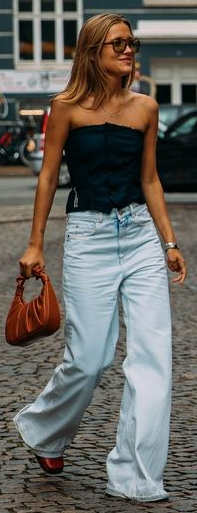

In [ ]:
imgs[0]

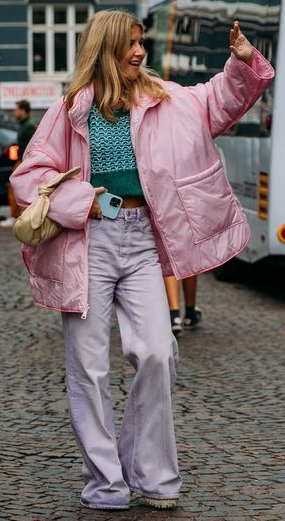

In [ ]:
imgs[1]

## YOLOS-Small (ft. Fashionpedia)

In [10]:
MODEL_NAME = "valentinafeve/yolos-fashionpedia"
feature_extractor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-small')
model = YolosForObjectDetection.from_pretrained(MODEL_NAME)

In [ ]:
model.to("cuda")

# 1. Example A

## 1.1 YOLOS-Small (ft. Fashionpedia)

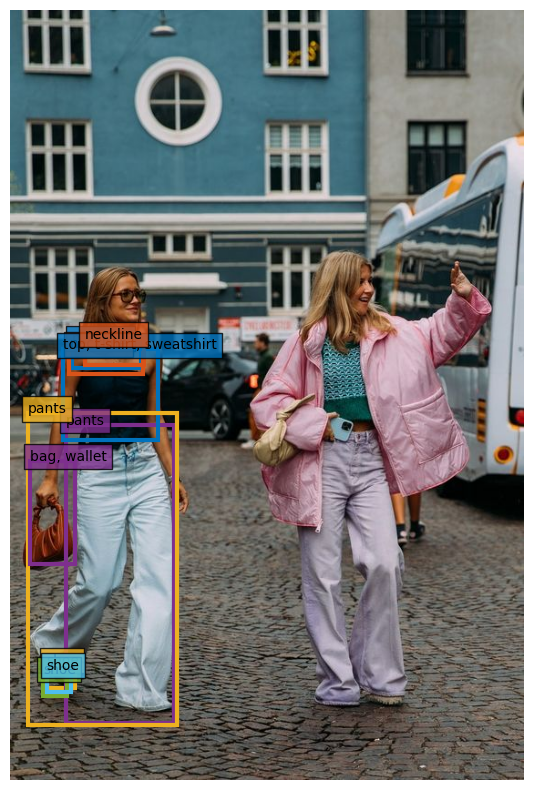

In [ ]:
inputs = feature_extractor(images=image, return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_full = visualize_predictions(image, outputs, threshold=0.5, image_path="fash4_full.png")
#res_full

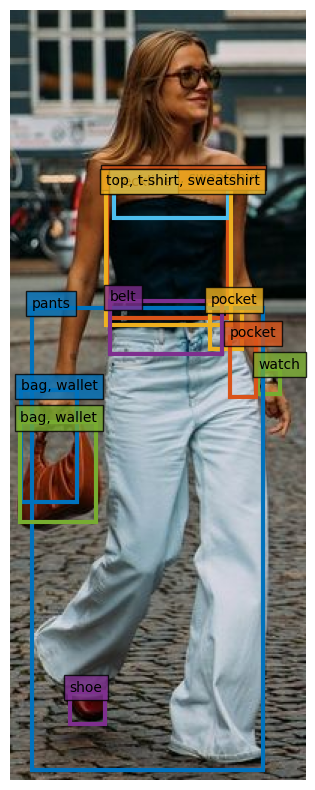

In [ ]:
inputs = feature_extractor(images=imgs[0], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_0 = visualize_predictions(imgs[0], outputs, threshold=0.5, image_path="fash4_per0.png")
#res_0

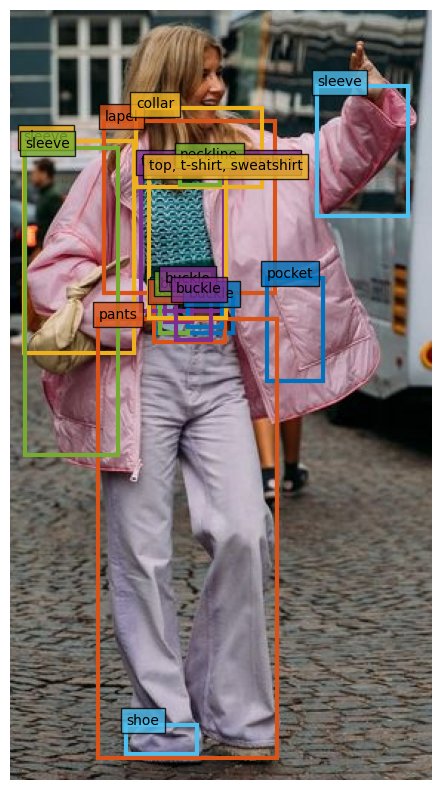

In [ ]:
inputs = feature_extractor(images=imgs[1], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_1 = visualize_predictions(imgs[1], outputs, threshold=0.5, image_path="fash4_per1.png")
#res_1

In [ ]:
imgs2 = [image.crop([d[0],0,d[2],image.size[1]]) for d in det]

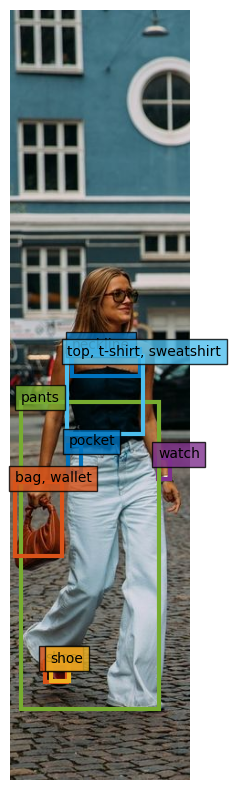

In [ ]:
inputs = feature_extractor(images=imgs2[0], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_0 = visualize_predictions(imgs2[0], outputs, threshold=0.5, image_path="fash4_per0_h.png")
#res_0

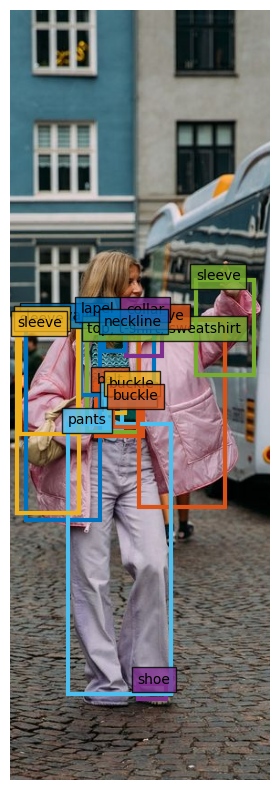

In [ ]:
inputs = feature_extractor(images=imgs2[1], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_1 = visualize_predictions(imgs2[1], outputs, threshold=0.5, image_path="fash4_per1_h.png")
#res_0

## 1.2. YOLOS-Tiny (ft. Spanish Dataset)

In [ ]:
clothes_detector = YolosForObjectDetection.from_pretrained('checkpoint-44000', local_files_only=True) # from checkpoint
clothes_processor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-tiny')

preprocessor_config.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/yolos/feature_extraction_yolos.py:38: FutureWarning: The class YolosFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use YolosImageProcessor instead.
  warnings.warn(


In [ ]:
clothes_detector.to("cuda")

In [ ]:
cats = ['shirt, blouse','top, t-shirt, sweatshirt','sweater','cardigan','jacket','vest','pants','shorts','skirt','coat','dress','jumpsuit','cape','glasses','hat','headband, head covering, hair accessory','tie','glove','watch','belt','leg warmer','tights, stockings','sock','shoe','bag, wallet','scarf','umbrella','hood','collar','lapel','epaulette','sleeve','pocket','neckline','buckle','zipper','applique','bead','bow','flower','fringe','ribbon','rivet','ruffle','sequin','tassel','earring','ring','bracelet','necklace','swimsuit','underwear','backpack']

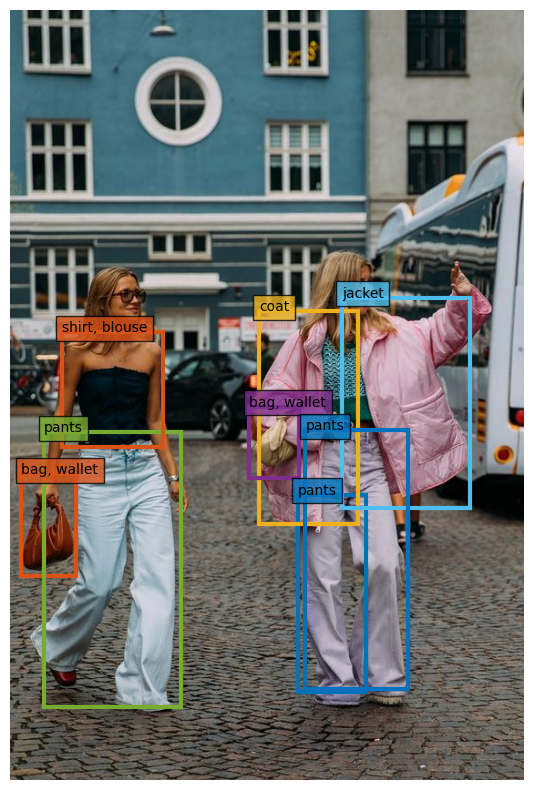

In [ ]:
inputs = clothes_processor(images=image, return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_full = visualize_predictions(image, outputs, threshold=0.5, image_path="fash4_full_ft.png")
#res_full

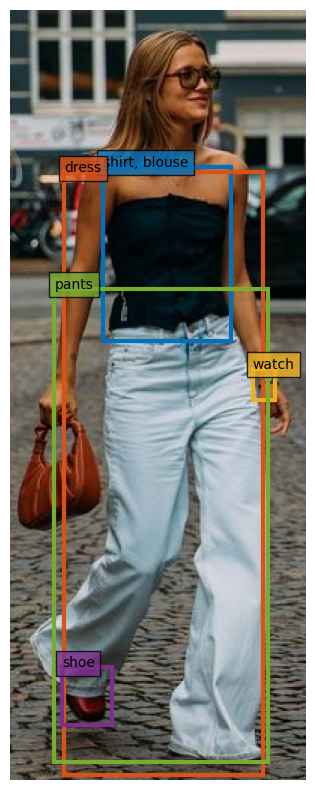

In [ ]:
inputs = clothes_processor(images=imgs[0], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_0 = visualize_predictions(imgs[0], outputs, threshold=0.5, image_path="fash4_per0_ft.png")
#res_0

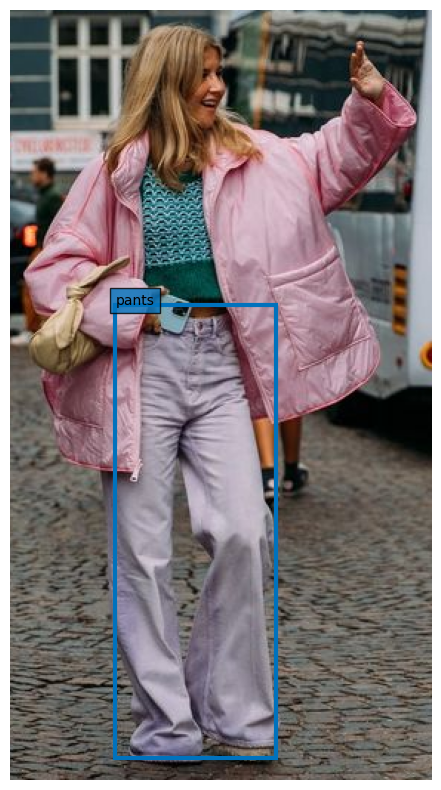

In [ ]:
inputs = clothes_processor(images=imgs[1], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_1 = visualize_predictions(imgs[1], outputs, threshold=0.5, image_path="fash4_per1_ft.png")
#res_0

In [ ]:
imgs2 = [image.crop([d[0],0,d[2],image.size[1]]) for d in det]

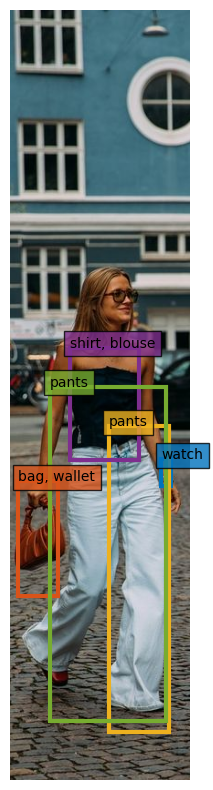

In [ ]:
inputs = clothes_processor(images=imgs2[0], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_0 = visualize_predictions(imgs2[0], outputs, threshold=0.5, image_path="fash4_per0_h_ft.png")
#res_0

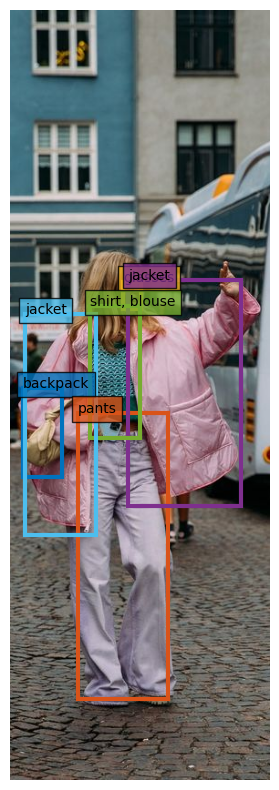

In [ ]:
inputs = clothes_processor(images=imgs2[1], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_1 = visualize_predictions(imgs2[1], outputs, threshold=0.5, image_path="fash4_per1_h_ft.png")
#res_0

# 2. Example B

In [ ]:
image = Image.open(open("fash3.jpg", "rb"))
image = fix_channels(ToTensor()(image))

In [ ]:
det = human_detection(human_detector, "fash3.jpg", 10)
det

[[545, 52, 691, 616], [379, 60, 575, 615], [240, 33, 411, 610]]

In [ ]:
imgs = [image.crop(d) for d in det]

## 2.1. YOLOS-Small (ft. Fashionpedia)

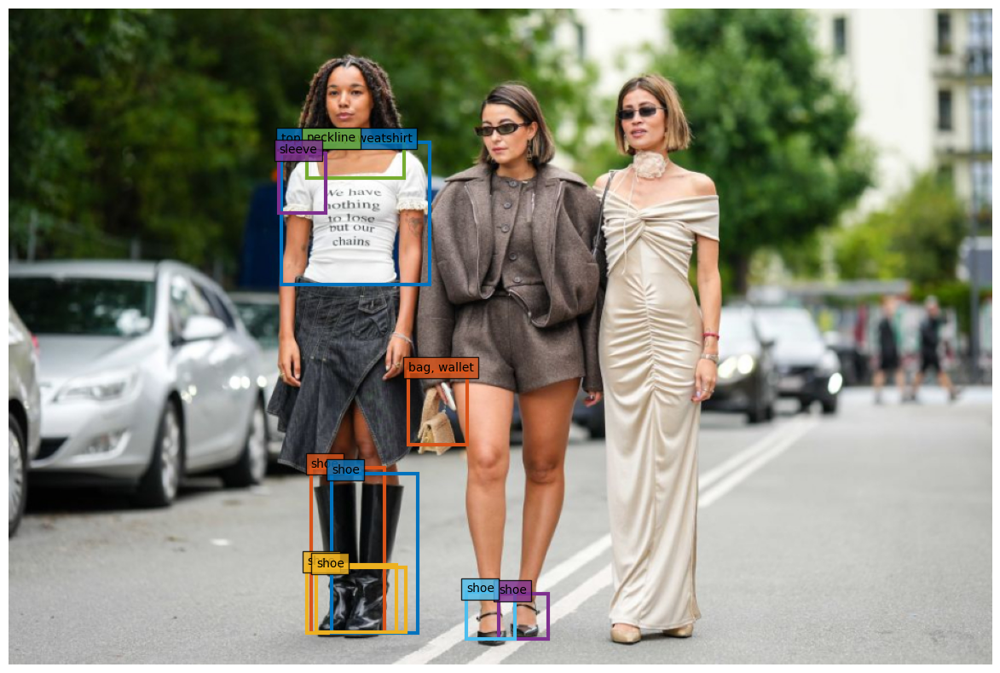

In [ ]:
inputs = feature_extractor(images=image, return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_full = visualize_predictions(image, outputs, threshold=0.5, image_path="fash3_full.png")
#res_full

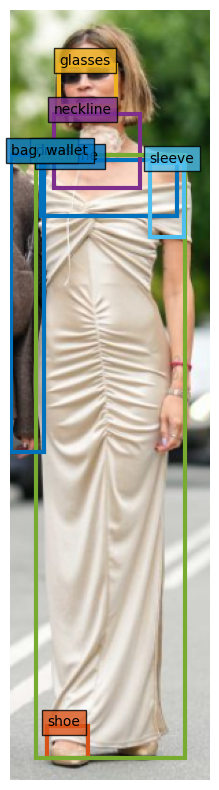

In [ ]:
inputs = feature_extractor(images=imgs[0], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_0 = visualize_predictions(imgs[0], outputs, threshold=0.5, image_path="fash3_per0.png")
#res_0

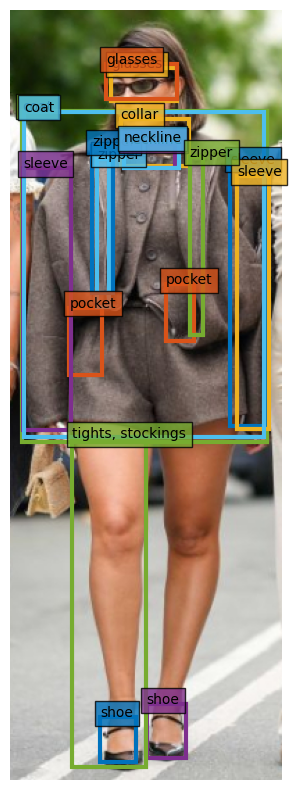

In [ ]:
inputs = feature_extractor(images=imgs[1], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_1 = visualize_predictions(imgs[1], outputs, threshold=0.5, image_path="fash3_per1.png")
#res_0

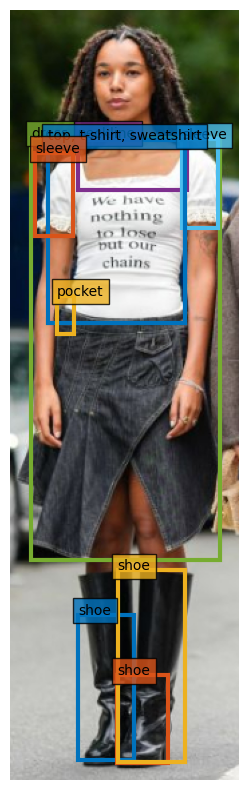

In [ ]:
inputs = feature_extractor(images=imgs[2], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_2 = visualize_predictions(imgs[2], outputs, threshold=0.5, image_path="fash3_per2.png")
#res_0

## 2.2. YOLOS-Tiny (ft. Spanish Dataset)

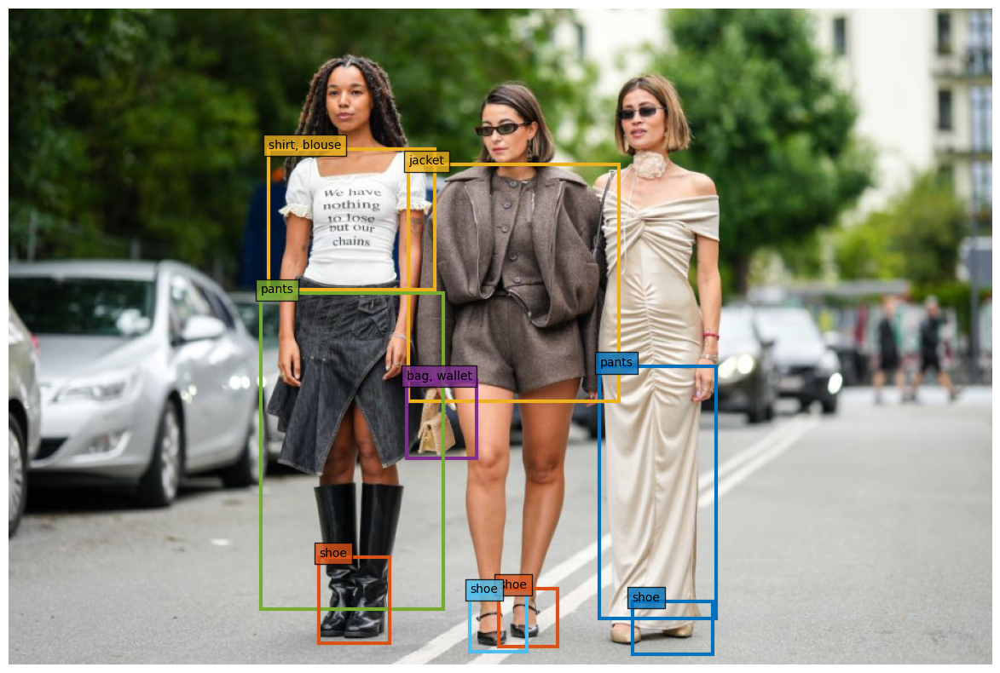

In [ ]:
inputs = clothes_processor(images=image, return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_full = visualize_predictions(image, outputs, threshold=0.5, image_path="fash3_full_ft.png")
#res_full

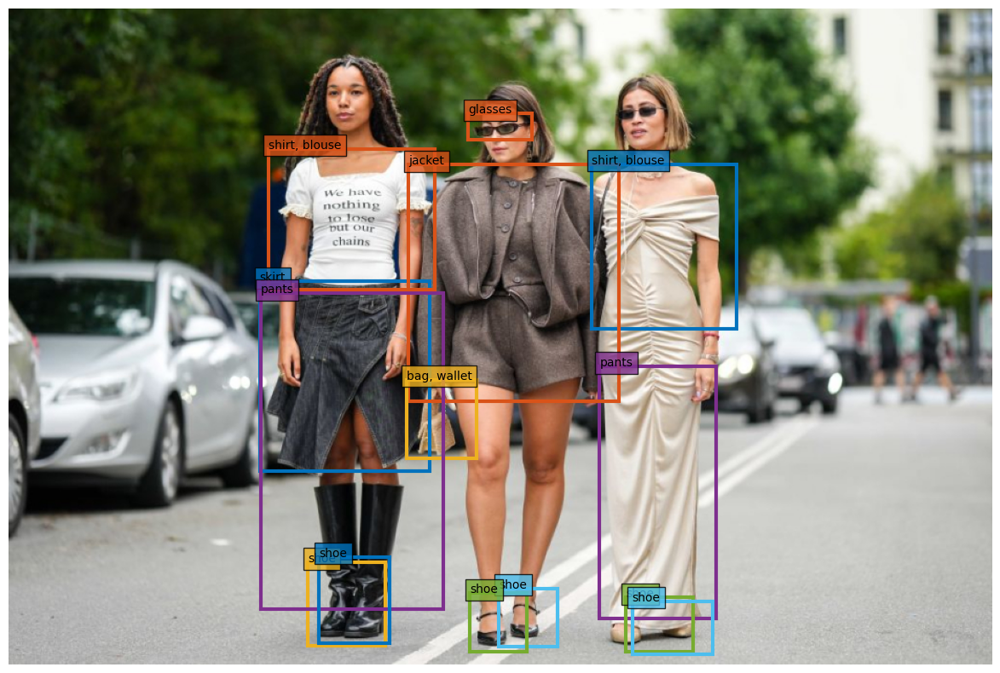

In [ ]:
res_full = visualize_predictions(image, outputs, threshold=0.3, image_path="fash3_full_ft_03.png")
#res_full

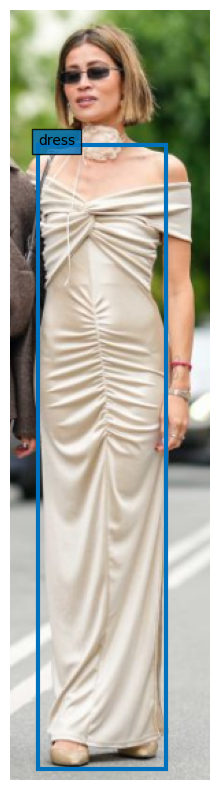

In [ ]:
inputs = clothes_processor(images=imgs[0], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_0 = visualize_predictions(imgs[0], outputs, threshold=0.5, image_path="fash3_per0_ft.png")
#res_0

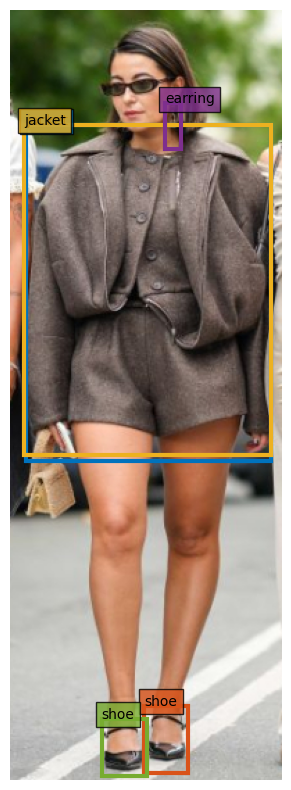

In [ ]:
inputs = clothes_processor(images=imgs[1], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_1 = visualize_predictions(imgs[1], outputs, threshold=0.5, image_path="fash3_per1_ft.png")
#res_0

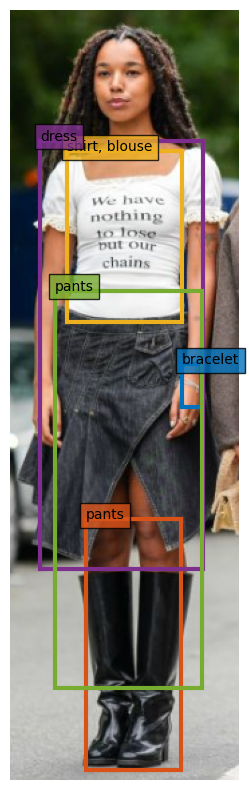

In [ ]:
inputs = clothes_processor(images=imgs[2], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_2 = visualize_predictions(imgs[2], outputs, threshold=0.5, image_path="fash3_per2_ft.png")
#res_0

## Human detection + Clothing detection

In [22]:
def process_predictions(probas, bboxes, x_tl, y_tl):
  detections = []
  for p, bbox in zip(probas, bboxes):
    cat_id = p.detach().cpu().numpy().argmax()
    x1, y1, x2, y2= bbox.detach().cpu().numpy()
    x1 += x_tl
    x2 += x_tl
    y1 += y_tl
    y2 += y_tl
    detections.append([cat_id,x1,y1,x2,y2])
  return detections

def predict(human_detector, clothes_detector, processor, img_path, img_pad, device="cuda:0"):
  # perform human detection 
  results = human_detector(img_path)

  predictions = results.pred[0]
  boxes = predictions[:, :4] # x1, y1, x2, y2
  scores = predictions[:, 4]
  categories = predictions[:, 5]

  img = Image.open(open(img_path, "rb"))
  img = fix_channels(ToTensor()(img))

  # sometimes pieces of garderob (ex. bag) can be outside the human bbox
  # in this case we may pad the human bbox for it to be used in clothing detection
  if type(img_pad) == int:
    img_pad = (img_pad, img_pad, img_pad, img_pad)
  elif len(img_pad) == 2:
    hor, ver = img_pad
    img_pad = (hor, ver, hor, ver)

  results = []
  # for each human in the image
  for i, bbox in enumerate(boxes):
    record = dict() 
    record["person_id"] = i
    # retrieve top-left and bottom-right coordinates
    x_tl, y_tl = bbox[0].item(), bbox[1].item()
    x_br, y_br = bbox[2].item(), bbox[3].item()
    record["bbox"] = [x_tl, y_tl ,x_br ,y_br]
    
    # perform padding to include pieces of clothing that may be outside the initial bbox
    x_tl = max(0,int(x_tl - img_pad[0]))
    y_tl = max(0,int(y_tl - img_pad[1]))
    x_br = min(int(x_br + img_pad[2]), img.size[0])
    y_br = min(int(y_br + img_pad[3]), img.size[1])
    # get the final human crop
    human_crop = [x_tl, y_tl, x_br, y_br]
    
    img_crop = img.crop(human_crop)
    # run clothing detection for a single person
    inputs = processor(images=img_crop, return_tensors="pt").to(device)
    outputs = clothes_detector(**inputs)

    probas = outputs.logits.softmax(-1)[0, :, :-1]
    # keep predicitions with confidence above the threshold 
    keep = probas.max(-1).values > 0.8

    # rescale clothing bboxes from [0..1]x[0..1] to [0..img_crop.w]x[0..img_crop.h]  
    bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), img_crop.size)
    probas = probas[keep]

    # shift clothing bboxes from [0..img_crop.w]x[0..img_crop.h] to [0..img.w]x[0..img.h] 
    detections = process_predictions(probas, bboxes_scaled, x_tl, y_tl)
    record["clothes"] = []
    for det in detections:
      cat_id = int(det[0])
      bbox = [float(v) for v in det[1:]]
      record["clothes"].append({"category_id": cat_id, "bbox": bbox})

    results.append(record)
  results = {"detections": results}
  return results, img
    
    
def plot_results(pil_img, results, image_path):
    fig = plt.figure(
        figsize=(16,10)
    )
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    color_id = 0
    for person_record in results['detections']:
      det = person_record['clothes']
      for clothes_rec in det:
        xmin, ymin, xmax, ymax = clothes_rec['bbox']
        cl = clothes_rec['category_id']

        ax.add_patch(
            plt.Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                fill=False, color=colors[color_id], linewidth=3
            )
        )
        ax.text(
            xmin, ymin, idx_to_text(cl), fontsize=10,
            bbox=dict(facecolor=colors[color_id], alpha=0.8)
        )
        color_id += 1
    plt.axis('off')
    #plt.show()
    plt.savefig(image_path)
    fig.canvas.draw()
    return Image.frombytes('RGB', fig.canvas.get_width_height(),fig.canvas.tostring_rgb())

# Per human detection pipeline

In [23]:
def per_human_predictor(human_detector, clothing_detector, feature_extractor, image,
                        img_pad=None, threshold=0.8):
    human_detections = human_detection(human_detector, image, img_pad)
    results = []
    for hd in human_detections:
        cropped_img = image.crop(hd)
        inputs = feature_extractor(images=cropped_img,
                                   return_tensors="pt")  # .to("cuda") # add this if using cuda
        outputs = clothing_detector(**inputs)
        probas = outputs.logits.softmax(-1)[0, :, :-1]
        keep = probas.max(-1).values > threshold
        bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(),
                                       cropped_img.size)
        boxes = bboxes_scaled.detach().numpy()

        elements = []
        for p, bbox in zip(probas[keep], boxes):
            single_element = {}
            single_element["object_name"] = idx_to_text(p.argmax())
            single_element["probability"] = float(p.max())
            single_element["relative_bbox"] = bbox
            absolute_bbox = []
            for i in range(2):
                absolute_bbox.append(bbox[i] + hd[i])
            absolute_bbox.append(bbox[2] + hd[0])
            absolute_bbox.append(bbox[3] + hd[1])
            single_element["absolute_bbox"] = absolute_bbox
            elements.append(single_element)
        single_human_elements = {"human_bbox": hd, "elements": elements}
        results.append(single_human_elements)
    return results

import random


def plot_results(image, per_human_detections):
    fig = plt.figure(
        figsize=(16,10)
    )
    plt.imshow(image)
    ax = plt.gca()
    for single_human_detection in per_human_detections:
        # Plot bbox over a human
        human_xmin, human_ymin, human_xmax, human_ymax = single_human_detection["human_bbox"]
        c_human = random.choice(COLORS)
        ax.add_patch(plt.Rectangle((human_xmin, human_ymin), human_xmax - human_xmin, human_ymax - human_ymin, fill=False,  color=c_human, linewidth=3))
        ax.text(human_xmin, human_ymin, "human", fontsize=10,
                bbox=dict(facecolor=c_human, alpha=0.8))
        single_human_elements = single_human_detection["elements"]
        for single_object in single_human_elements:
            xmin, ymin, xmax, ymax = single_object["absolute_bbox"]
            x_diff = xmax - xmin
            y_diff = ymax - ymin
            c = random.choice(COLORS) 
            ax.add_patch(plt.Rectangle((xmin, ymin), x_diff, y_diff, fill=False,  color=c, linewidth=3))
            ax.text(*single_object["absolute_bbox"][:2], single_object["object_name"], fontsize=10,
                bbox=dict(facecolor=c, alpha=0.8))
    plt.axis('off')
    #plt.show()
    # plt.savefig()
    fig.canvas.draw()
    return Image.frombytes('RGB', fig.canvas.get_width_height(),fig.canvas.tostring_rgb())

# usage
#image = Image.open(open("fash4.jpg", "rb"))
#image = fix_channels(ToTensor()(image))
#MODEL_NAME = "valentinafeve/yolos-fashionpedia"
#feature_extractor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-small')
#model = YolosForObjectDetection.from_pretrained(MODEL_NAME)

#per_human_detections = per_human_predictor(human_detector, model, feature_extractor, image, threshold=0.8)
#print(per_human_detections)

#plot_results(image, per_human_detections);

In [24]:
import transformers
from transformers import set_seed

set_seed(12)

MODEL = transformers.YolosForObjectDetection.from_pretrained('checkpoint_new', local_files_only=True) # from checkpoint
#MODEL = transformers.YolosForObjectDetection.from_pretrained('valentinafeve/yolos-fashionpedia')
#MODEL = transformers.YolosForObjectDetection.from_pretrained('itesl/yolos-tiny-fashionpedia-remapped')
PROCESSOR = transformers.YolosFeatureExtractor.from_pretrained('hustvl/yolos-tiny')

In [25]:
import os
os.environ['HF_HOME'] = "D:/Workforce_Attire/.cache"

import datasets
fashionpedia = datasets.load_dataset("detection-datasets/fashionpedia")
#fashionpedia = datasets.load_dataset("12is/fashionpedia_remapped")

from metric_computation_functions import *

In [26]:
labs = fashionpedia["train"].features['objects'].feature['category'].names
LABEL_DICT, LABEL_DICT_REVERSE = create_label_dict(labs)

In [27]:
def get_preds_from_per_human_predictor(image, human_detector, model, feature_extractor, threshold=0.8):
    res = per_human_predictor(human_detector=human_detector, clothing_detector=model, feature_extractor=feature_extractor, image=image, threshold=threshold)
    bbs = []
    labels = []
    scores = []
    for r in res:
        for ele in r['elements']:
            bbs.append(ele['absolute_bbox'])
            labels.append(LABEL_DICT_REVERSE[ele['object_name']])
            scores.append(ele['probability'])
    pred_dict = dict()
    pred_dict['boxes'] = bbs
    pred_dict['labels'] = labels
    pred_dict['scores'] = scores
    return pred_dict

DATASET = fashionpedia['val']

# Our model on fashionpedia dataset

In [28]:
def rescale_bboxes_to_img(bboxes, width, height):
    return torch.Tensor(bboxes) / torch.tensor([width, height, width, height], dtype=torch.float32)
    
    
def center_bbox_xy(bbox):
    centered_boxes = []
    for bb in bbox:
        x1, y1, x2, y2 = bb
        width = x2-x1
        height = y2-y1
        xc = x1 + width*0.5
        yc = y1 + height*0.5
        centered_boxes.append(torch.stack([xc, yc, width, height]))
    return torch.stack(centered_boxes)

In [10]:
import os
from tqdm import tqdm



IMAGE_PATH='metrics_data/images_f_h' # path to which we save images from the dataset
ANNOTATIONS_PATH='metrics_data/annots_f_h' # path to which we save ground truths from the dataset
DETECTION_PATH='metrics_data/dcs_f_h' # path to which we save predictions 
CLASSES_PATH='metrics_data/fashionpedia_f_h.names' # path to file with all classes names

for path in [IMAGE_PATH, ANNOTATIONS_PATH, DETECTION_PATH]:
    if not os.path.exists(path):
        os.mkdir(path)

        
#with open(CLASSES_PATH, "w") as f:
#    for cls in fashionpedia["train"].features['objects'].feature['category'].names:
#        f.write(f"{cls}\n")        
def write_data_for_soft():
    for i, data in enumerate(tqdm(DATASET)):
        image = data['image']
        image.save(os.path.join(IMAGE_PATH, f"{i}.jpg")) # saving image
        p_dict = get_preds_from_per_human_predictor(image, human_detector, MODEL, PROCESSOR, threshold=0.85) # model inference
        p_bbs = p_dict['boxes']
        p_labels = p_dict['labels']
        p_scores = p_dict['scores']
        annotations = data['objects'] 
        width = data["width"]
        height = data["height"]
        boxes = center_bbox_xy(rescale_bboxes_to_img(annotations['bbox'], width, height))
        with open(os.path.join(ANNOTATIONS_PATH, f"{i}.txt"), "w") as f:
            for box, label in zip(boxes, annotations['category']): # saving ground truths
                f.write(f"{label} {box[0]} {box[1]} {box[2]} {box[3]}\n")
        
        idxes = np.argsort(np.array(p_scores))[::-1] # indexes for sorting by prediction score
        with open(os.path.join(DETECTION_PATH, f"{i}.txt"), "w") as f:
            for score, label, box in zip(np.array(p_scores)[idxes], \
                                        np.array(p_labels)[idxes], \
                                        np.array(p_bbs)[idxes]):
                f.write(f"{label} {score} {int(box[0])} {int(box[1])} {int(box[2])} {int(box[3])}\n") # saving predictions

write_data_for_soft()

In [53]:
metrics_fashionpedia = assess_model(DATASET, LABEL_DICT, get_preds_from_per_human_predictor, human_detector=human_detector, model=MODEL, feature_extractor=PROCESSOR, threshold=0.85)

100%|██████████| 1158/1158 [1:25:49<00:00,  4.45s/it]


In [54]:
fnps_fashionpedia = calculate_positives_negatives(metrics_fashionpedia, LABEL_DICT.values(), threshold=0.4)
write_fnp_dict(fnps_fashionpedia, "fnps_fashionpedia")

In [55]:
prec, rec = average_scores(metrics_fashionpedia, fnps_fashionpedia)
print(f"Average precision= {prec}")
print(f"Average recall= {rec}")

Average precision= 0.55266708520197
Average recall= 0.349732376722469


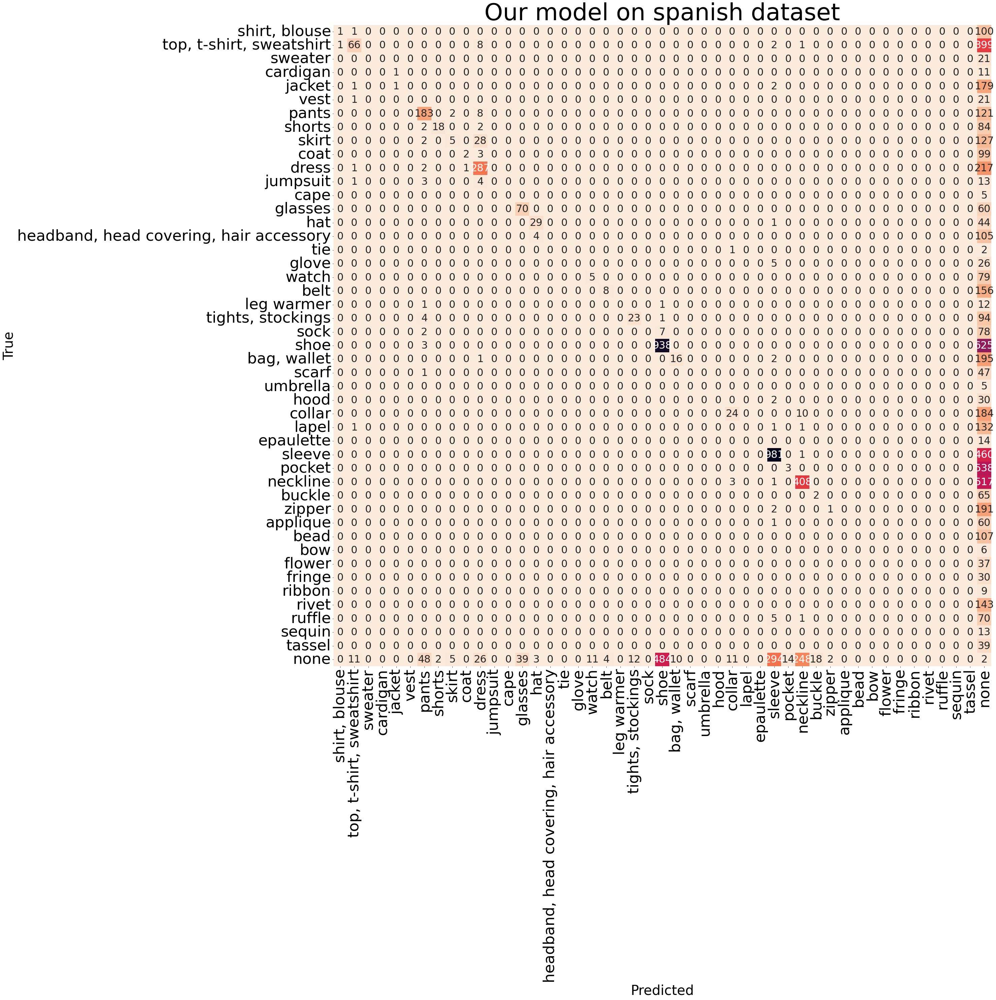

In [56]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

cm = pd.DataFrame(compute_confusion_matrix(metrics_fashionpedia, LABEL_DICT_REVERSE, 0.4),
                 columns=list(LABEL_DICT.values()),
                 index=list(LABEL_DICT.values())
                 )

plt.figure(figsize=(35,35))

sns.heatmap(cm, annot=True, 
            fmt='.10g',
           cmap=sns.cm.rocket_r,
           cbar=False,
           annot_kws={'size': 30})
plt.xlabel("Predicted", fontsize=40)
plt.ylabel("True", fontsize=40)
plt.xticks(fontsize=45, rotation=90)
plt.yticks(fontsize=45, rotation=0)
plt.title("Our model on spanish dataset", fontsize=70)
plt.show()

# "Baseline" model on fashionpedia dataset

In [29]:
MODEL = transformers.YolosForObjectDetection.from_pretrained('valentinafeve/yolos-fashionpedia')

In [30]:

IMAGE_PATH='metrics_data/images_f_h' # path to which we save images from the dataset
ANNOTATIONS_PATH='metrics_data/annots_baseline_h' # path to which we save ground truths from the dataset
DETECTION_PATH='metrics_data/dcs_baseline_h' # path to which we save predictions 
CLASSES_PATH='metrics_data/fashionpedia_baseline_h.names' # path to file with all classes names

for path in [IMAGE_PATH, ANNOTATIONS_PATH, DETECTION_PATH]:
    if not os.path.exists(path):
        os.mkdir(path)

        
write_data_for_soft()

100%|██████████| 1158/1158 [2:15:57<00:00,  7.04s/it] 


In [58]:
metrics_baseline = assess_model(DATASET, LABEL_DICT, get_preds_from_per_human_predictor, human_detector=human_detector, model=MODEL, feature_extractor=PROCESSOR, threshold=0.85)

100%|██████████| 1158/1158 [2:30:45<00:00,  7.81s/it] 


In [59]:
fnps_baseline = calculate_positives_negatives(metrics_baseline, LABEL_DICT.values(), threshold=0.4)
write_fnp_dict(fnps_baseline, "fnps_baseline")

In [60]:
prec, rec = average_scores(metrics_baseline, fnps_baseline)
print(f"Average precision= {prec}")
print(f"Average recall= {rec}")

Average precision= 0.6598385873202426
Average recall= 0.3825304635007402


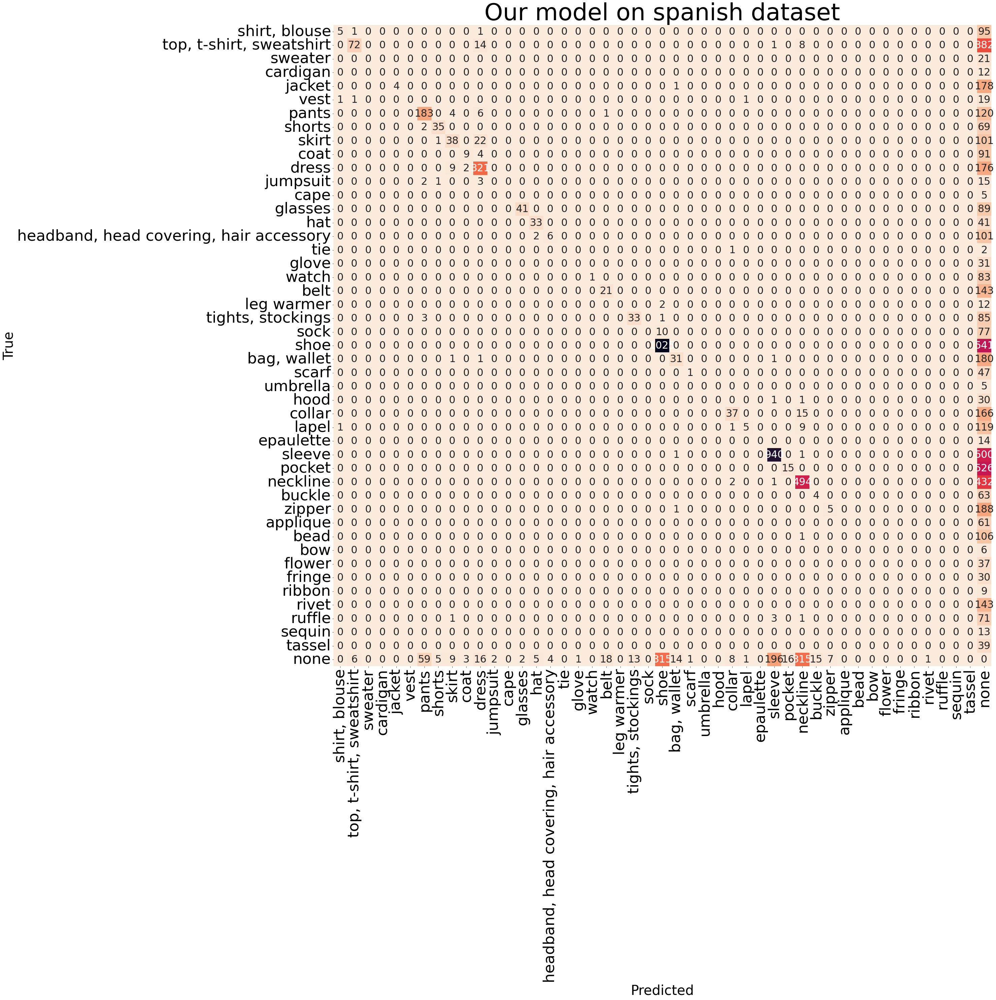

In [61]:
cm = pd.DataFrame(compute_confusion_matrix(metrics_baseline, LABEL_DICT_REVERSE, 0.4),
                 columns=list(LABEL_DICT.values()),
                 index=list(LABEL_DICT.values())
                 )

plt.figure(figsize=(35,35))

sns.heatmap(cm, annot=True, 
            fmt='.10g',
           cmap=sns.cm.rocket_r,
           cbar=False,
           annot_kws={'size': 30})
plt.xlabel("Predicted", fontsize=40)
plt.ylabel("True", fontsize=40)
plt.xticks(fontsize=45, rotation=90)
plt.yticks(fontsize=45, rotation=0)
plt.title("Our model on spanish dataset", fontsize=70)
plt.show()

# Our model on the remapped dataset

In [31]:
MODEL = transformers.YolosForObjectDetection.from_pretrained('itesl/yolos-tiny-fashionpedia-remapped')
fashionpedia = datasets.load_dataset("12is/fashionpedia_remapped")
#fashionpedia = datasets.load_dataset("detection-datasets/fashionpedia")
labs = fashionpedia["train"].features['objects'].feature['category'].names
LABEL_DICT, LABEL_DICT_REVERSE = create_label_dict(labs)

cats = list(LABEL_DICT.values())[:-1]

DATASET = fashionpedia['val']


Using the latest cached version of the dataset since 12is/fashionpedia_remapped couldn't be found on the Hugging Face Hub
Found the latest cached dataset configuration 'default' at D:\Workforce_Attire\.cache\datasets\12is___fashionpedia_remapped\default\0.0.0\cb242a0a4b630b648ca384950f74af8d21fb16fa (last modified on Mon Jun 17 18:29:48 2024).


In [32]:


IMAGE_PATH='metrics_data/images_f_h' # path to which we save images from the dataset
ANNOTATIONS_PATH='metrics_data/annots_remapped_h' # path to which we save ground truths from the dataset
DETECTION_PATH='metrics_data/dcs_remapped_h' # path to which we save predictions 
CLASSES_PATH='metrics_data/fashionpedia_remapped_h.names' # path to file with all classes names

for path in [IMAGE_PATH, ANNOTATIONS_PATH, DETECTION_PATH]:
    if not os.path.exists(path):
        os.mkdir(path)

        
with open(CLASSES_PATH, "w") as f:
    for cls in fashionpedia["train"].features['objects'].feature['category'].names:
        f.write(f"{cls}\n")        

write_data_for_soft()

100%|██████████| 1158/1158 [1:16:13<00:00,  3.95s/it]


In [63]:
metrics_remapped = assess_model(DATASET, LABEL_DICT, get_preds_from_per_human_predictor, human_detector=human_detector, model=MODEL, feature_extractor=PROCESSOR, threshold=0.85)

100%|██████████| 1158/1158 [1:17:25<00:00,  4.01s/it]


In [64]:
fnps_remapped = calculate_positives_negatives(metrics_remapped, LABEL_DICT.values(), threshold=0.4)
write_fnp_dict(fnps_remapped, "fnps_remapped")

In [65]:
prec, rec = average_scores(metrics_remapped, fnps_remapped)
print(f"Average precision= {prec}")
print(f"Average recall= {rec}")

Average precision= 0.6695179218529859
Average recall= 0.4072429108302016


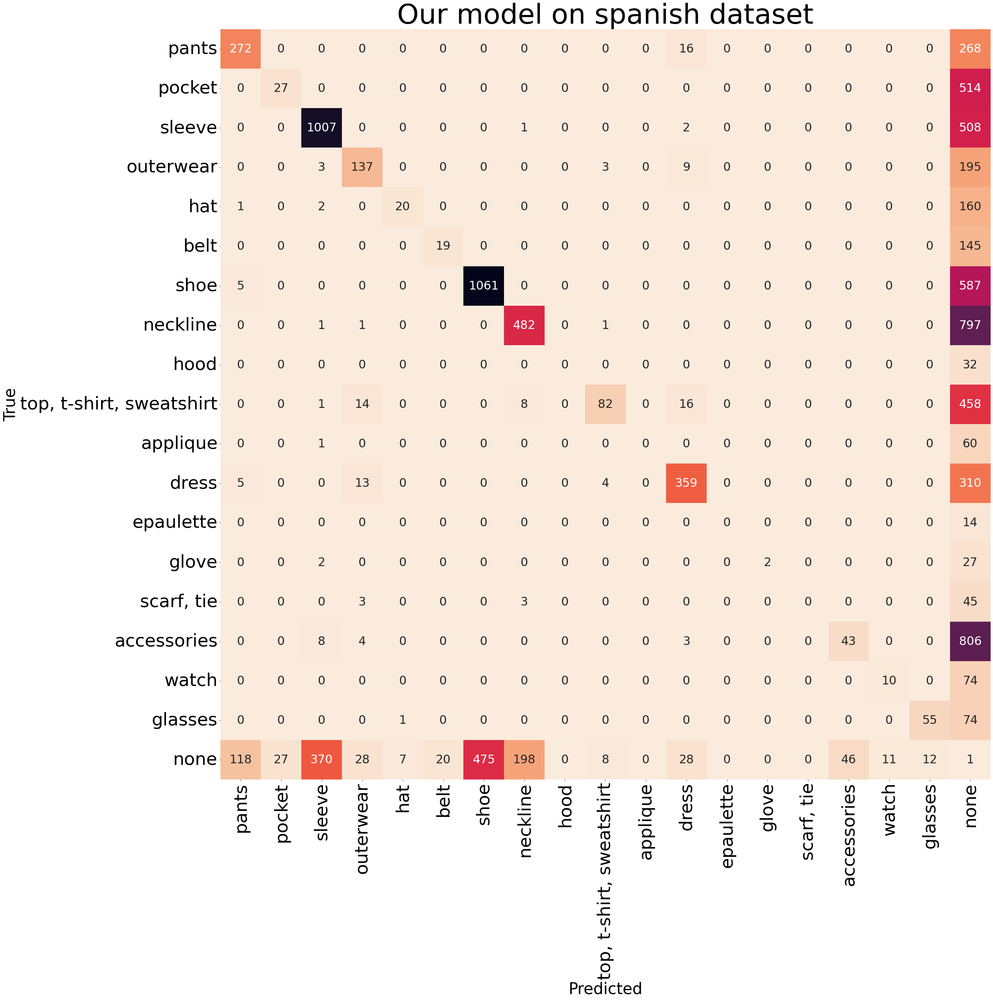

In [66]:
cm = pd.DataFrame(compute_confusion_matrix(metrics_remapped, LABEL_DICT_REVERSE, 0.4),
                 columns=list(LABEL_DICT.values()),
                 index=list(LABEL_DICT.values())
                 )

plt.figure(figsize=(35,35))

sns.heatmap(cm, annot=True, 
            fmt='.10g',
           cmap=sns.cm.rocket_r,
           cbar=False,
           annot_kws={'size': 30})
plt.xlabel("Predicted", fontsize=40)
plt.ylabel("True", fontsize=40)
plt.xticks(fontsize=45, rotation=90)
plt.yticks(fontsize=45, rotation=0)
plt.title("Our model on spanish dataset", fontsize=70)
plt.show()

# Spanish dataset

In [24]:
full_data = datasets.load_from_disk("data/")
es = datasets.load_dataset("adam-narozniak/clothing")

Loading dataset from disk:   0%|          | 0/48 [00:00<?, ?it/s]

In [25]:
MODEL = transformers.YolosForObjectDetection.from_pretrained('checkpoint-44000', local_files_only=True)
LABEL_DICT, LABEL_DICT_REVERSE = create_label_dict(es["train"].features['objects'].feature['category'].names)
DATASET = full_data['test']

In [27]:
cats = list(LABEL_DICT.values())[:-1]

In [ ]:
metrics_spanish = assess_model(DATASET, LABEL_DICT, get_preds_from_per_human_predictor, human_detector=human_detector, model=MODEL, feature_extractor=PROCESSOR, threshold=0.85)

In [31]:
fnps_spanish = calculate_positives_negatives(metrics_spanish, LABEL_DICT.values(), threshold=0.4)
write_fnp_dict(fnps_spanish, "fnps_spanish")

In [32]:
prec, rec = average_scores(metrics_spanish, fnps_spanish)
print(f"Average precision= {prec}")
print(f"Average recall= {rec}")

Average precision= 0.4157151682160148
Average recall= 0.3924677898909812


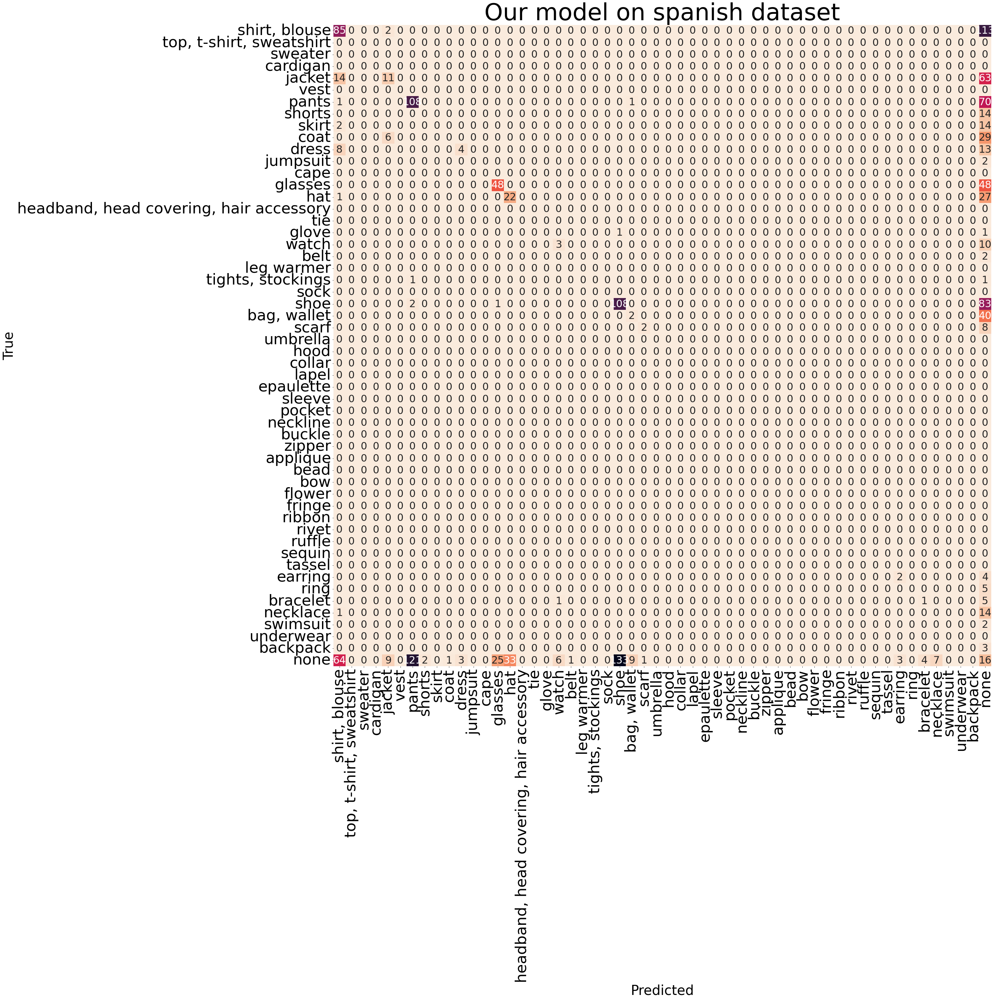

In [35]:
cm = pd.DataFrame(compute_confusion_matrix(metrics_spanish, LABEL_DICT_REVERSE, 0.4),
                 columns=list(LABEL_DICT.values()),
                 index=list(LABEL_DICT.values())
                 )

plt.figure(figsize=(35,35))

sns.heatmap(cm, annot=True, 
            fmt='.10g',
           cmap=sns.cm.rocket_r,
           cbar=False,
           annot_kws={'size': 30})
plt.xlabel("Predicted", fontsize=40)
plt.ylabel("True", fontsize=40)
plt.xticks(fontsize=45, rotation=90)
plt.yticks(fontsize=45, rotation=0)
plt.title("Our model on spanish dataset", fontsize=70)
plt.show()

In [18]:
def rescale_bboxes_to_img(bboxes, width, height):
    return torch.Tensor(bboxes) / torch.tensor([width, height, width, height], dtype=torch.float32)
    
    
def center_bbox_xy(bbox):
    centered_boxes = []
    for bb in bbox:
        x1, y1, x2, y2 = bb
        width = x2-x1
        height = y2-y1
        xc = x1 + width*0.5
        yc = y1 + height*0.5
        centered_boxes.append(torch.stack([xc, yc, width, height]))
    return torch.stack(centered_boxes)

In [288]:
import os
from tqdm import tqdm



IMAGE_PATH='metrics_data/images_f_h' # path to which we save images from the dataset
ANNOTATIONS_PATH='metrics_data/annots_f_h' # path to which we save ground truths from the dataset
DETECTION_PATH='metrics_data/dcs_f_h' # path to which we save predictions 
CLASSES_PATH='metrics_data/fashionpedia_f_h.names' # path to file with all classes names

for path in [IMAGE_PATH, ANNOTATIONS_PATH, DETECTION_PATH]:
    if not os.path.exists(path):
        os.mkdir(path)

        
#with open(CLASSES_PATH, "w") as f:
#    for cls in fashionpedia["train"].features['objects'].feature['category'].names:
#        f.write(f"{cls}\n")        

for i, data in enumerate(tqdm(DATASET)):
    image = data['image']
    image.save(os.path.join(IMAGE_PATH, f"{i}.jpg")) # saving image
    p_bbs, p_labels, p_scores = get_preds_from_per_human_predictor(human_detector, MODEL, PROCESSOR, image) # model inference
    annotations = data['objects'] 
    width = data["width"]
    height = data["height"]
    boxes = center_bbox_xy(rescale_bboxes_to_img(annotations['bbox'], width, height))
    with open(os.path.join(ANNOTATIONS_PATH, f"{i}.txt"), "w") as f:
        for box, label in zip(boxes, annotations['category']): # saving ground truths
            f.write(f"{label} {box[0]} {box[1]} {box[2]} {box[3]}\n")
    
    idxes = np.argsort(np.array(p_scores))[::-1] # indexes for sorting by prediction score
    
    with open(os.path.join(DETECTION_PATH, f"{i}.txt"), "w") as f:
        for score, label, box in zip(np.array(p_scores)[idxes], \
                                     np.array(p_labels)[idxes], \
                                     np.array(p_bbs)[idxes]):
            f.write(f"{label} {score} {int(box[0])} {int(box[1])} {int(box[2])} {int(box[3])}\n") # saving predictions

100%|██████████| 1158/1158 [2:37:16<00:00,  8.15s/it] 
